In [1]:
import numpy as np
from astropy.visualization import make_lupton_rgb
import torch
import torchvision
from torchvision.models.detection.rpn import AnchorGenerator
from torch.utils.data import DataLoader, Dataset
from utils.tool import Averager, collate_fn
import glob
from CSST import CSSTimg
from tqdm import tqdm

In [2]:
%pylab
%matplotlib inline
%config InlineBackend.figure_format='retina'

rcParams["savefig.dpi"] = 100
rcParams["figure.dpi"] = 100
rcParams["font.size"] = 14

Using matplotlib backend: agg
Populating the interactive namespace from numpy and matplotlib


In [23]:
model_ft = torchvision.models.detection.retinanet_resnet50_fpn(pretrained=True)
# model_ft = torchvision.models.mobilenet_v2(pretrained=True)

def load_retina(model_nme, model_raw, device=torch.device('cuda:1')):
    
    model_raw.load_state_dict(torch.load(model_nme))
    model_raw = model_raw.to(device)
    model_raw.eval()

    for param in model_raw.parameters():
        param.requires_grad = False
    return model_raw

model_dir = "/data/jdli/model/"
model_nme = "Retina1026_mag24.bin"
model     =  load_retina(model_dir+model_nme, model_ft, device=torch.device('cuda:1'))

img_dir = "/data/jdli/C3test/img"
tgt_dir = "/data/jdli/C3test/target/"
c3val_data  = CSSTimg(img_dir, tgt_dir)

# Show Raw data

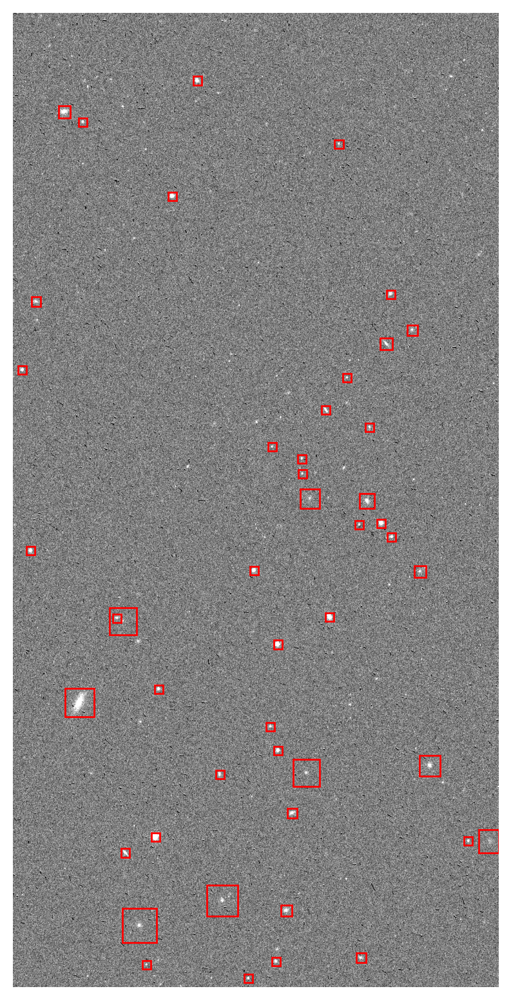

In [13]:
c3val = c3val_data[10]

fig, ax = plt.subplots(1,1, figsize=(8,10))
ax.imshow(c3val[0][0].reshape(2308, 1152), vmin=0.2, vmax=0.8, cmap='gray')
ax.set_axis_off()
# ax.scatter(ximg, yimg, s=50, facecolors='none', edgecolors='r')

for box in c3val[1]['boxes']:
    ax.add_patch(
        Rectangle(
            (box[0], box[1]), box[2]-box[0], box[3]-box[1],
            edgecolor='red',facecolor='none', lw=1
            )
        )

In [25]:
def model_to_pred(dataloader, model, device=torch.device('cuda:0')):
    images, targets = [], []
    outputs = []

    for image, target in tqdm(dataloader):

        images+=list(img.to(device) for img in image)
        targets+=[{k:v for k, v in t.items()} for t in target]

        output = model(list(img.to(device) for img in image))
        outputs+=[{k:v.to(torch.device("cpu")) for k,v in t.items()} for t in output]
        del image, target
    return images, targets, outputs


dataloader = DataLoader(
    c3val_data, batch_size=48, shuffle=True, num_workers=0,
    collate_fn=collate_fn
)

output_lst = []
target_lst = []


images, targets, outputs = model_to_pred(dataloader, model, device=torch.device('cuda:1'))
# del images
output_lst.append(outputs)
target_lst.append(targets)

100%|██████████████████████████████████████████████████████████| 14/14 [00:33<00:00,  2.39s/it]


In [18]:
torch.cuda.empty_cache()

In [19]:
np.random.seed(0)
val_idx = np.random.randint(0, len(targets), 5)

img_nme_lst = [c3val_data.img_names[idx] for idx in val_idx]
print(img_nme_lst)

vis_img  = [images[idx]  for idx in val_idx]
vis_pred = [outputs[idx] for idx in val_idx]
vis_true = [targets[idx] for idx in val_idx]

['/data/jdli/C3test/img/img7chip22.fits', '/data/jdli/C3test/img/img9chip28.fits', '/data/jdli/C3test/img/img15chip0.fits', '/data/jdli/C3test/img/img1chip15.fits', '/data/jdli/C3test/img/img0chip17.fits']


In [20]:
from torchvision.ops import nms, remove_small_boxes

def post_process_box(boxes, scores, labels, score_threshold=0.2, 
                     iou_threshold=0.2, min_size=1):
    
    idx_nms = nms(boxes=boxes, scores=scores, iou_threshold=iou_threshold)
    idx_rmv_small = remove_small_boxes(boxes=boxes, min_size=min_size)
    idx_score = np.nonzero(scores>score_threshold)
    
    idx_post = np.intersect1d(idx_nms, idx_rmv_small)
    idx_post = np.intersect1d(idx_post, idx_score)
    
    return {'boxes':boxes[idx_post], 'scores':scores[idx_post], 'labels':labels[idx_post]}

def ground_truth(target):
    gt = np.c_[target['boxes'], target['labels']]
    gt = np.insert(gt, 5, values=0, axis=1)
    gt = np.insert(gt, 6, values=0, axis=1)
    return gt


def pred_result(output, score=0.2, iou=0.2):
    output = post_process_box(
        output['boxes'], output['scores'], output['labels'], 
        score_threshold=score, iou_threshold=iou
    )
    pred = np.c_[output['boxes'], output['labels'], output['scores']]
    return pred



In [21]:
gts = [ground_truth(target) for target in vis_true]
preds = [pred_result(output) for output in vis_pred]

# Evaluate Results

In [22]:
# len(targets), len(outputs)
# output_lst, target_lst
gt_lst, pred_lst = [], []

for i in range(len(output_lst)):
    targets, outputs = target_lst[i], output_lst[i]
    
    gts   = [ground_truth(target) for target in targets]
    preds = [pred_result(output, score=0.2, iou=0.2) for output in outputs]
    
    gt_lst.append(gts)
    pred_lst.append(preds)

targets, outputs = target_lst[0], output_lst[0]
vis_pred = [outputs[idx] for idx in val_idx]
vis_true = [targets[idx] for idx in val_idx]

gts = [ground_truth(target) for target in vis_true]
preds = [pred_result(output, score=0.2, iou=0.2) for output in vis_pred]

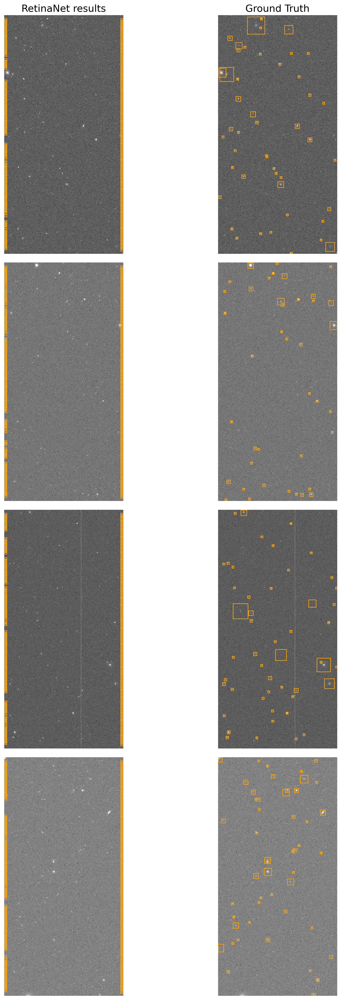

In [23]:
plot_num = 4

fig, axs = plt.subplots(plot_num,2, figsize=(13, 6*plot_num))

for i in range(plot_num):
    im = vis_img[i].to(torch.device("cpu")).reshape(2308, 1152)
    ax1, ax2 = axs[i,:]
    ax1.imshow(im, vmin=0.2, vmax=1, cmap='gray')
    ax1.set_axis_off()
    
    boxes = vis_pred[i]['boxes'][:,0:4]
    for box in boxes:
        ax1.add_patch(
            Rectangle(
                (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                edgecolor='orange',facecolor='none', lw=1
                )
            )
    if i == 0:
        ax1.set_title('RetinaNet results');

    boxes_truth = vis_true[i]['boxes']
    ax2.imshow(im, vmin=0.2, vmax=1, cmap='gray')
    ax2.set_axis_off()

    for box in boxes_truth:
        ax2.add_patch(
            Rectangle(
                (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                edgecolor='orange',facecolor='none', lw=1
                )
            )
    if i == 0:
        ax2.set_title('Ground Truth');
        
plt.tight_layout()

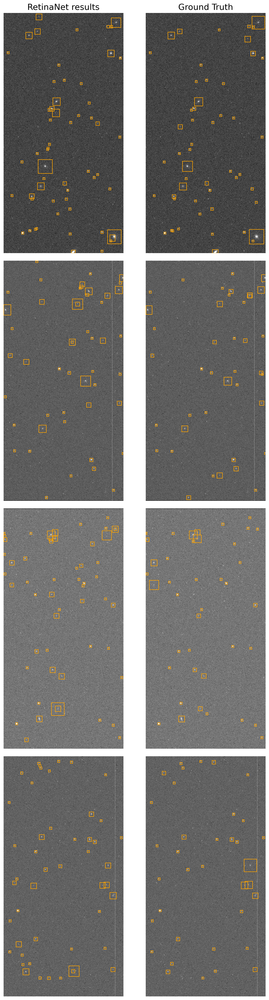

In [58]:
plot_num = 4

fig, axs = plt.subplots(plot_num,2, figsize=(9, 7*plot_num))

for i in range(plot_num):
    im = vis_img[i].to(torch.device("cpu")).reshape(2308, 1152)
    ax1, ax2 = axs[i,:]
    ax1.imshow(im, vmin=0.2, vmax=1, cmap='gray')
    ax1.set_axis_off()
    
    boxes = preds[i][:,0:4]
    for box in boxes:
        ax1.add_patch(
            Rectangle(
                (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                edgecolor='orange',facecolor='none', lw=1
                )
            )
    if i == 0:
        ax1.set_title('RetinaNet results');

    boxes_truth = gts[i][:,0:4]
    ax2.imshow(im, vmin=0.2, vmax=1, cmap='gray')
    ax2.set_axis_off()

    for box in boxes_truth:
        ax2.add_patch(
            Rectangle(
                (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                edgecolor='orange',facecolor='none', lw=1
                )
            )
    if i == 0:
        ax2.set_title('Ground Truth');
plt.tight_layout()

In [34]:
from mean_average_precision import MetricBuilder


def detect_metric(pred, gt, num_classes=2):
    
    metric_fn = MetricBuilder.build_evaluation_metric(
        "map_2d", async_mode=True, num_classes=num_classes)
    
    for i in range(len(pred)):
        metric_fn.add(pred[i], gt[i])
        
    return metric_fn

In [35]:
# metric_fn = MetricBuilder.build_evaluation_metric("map_2d", async_mode=True, num_classes=2)

# for i in range(len(preds)):
#     metric_fn.add(preds[i], gts[i])
# preds, gts = pred_lst[0], gt_lst[0]
gts   = [ground_truth(target) for target in targets]
preds = [pred_result(output, score=0.2, iou=0.2) for output in outputs]

metric_fn = detect_metric(preds, gts)
iou = 0.5
print(metric_fn.value(iou_thresholds=iou, recall_thresholds=np.arange(0., 1.1, 0.1))['mAP'])
print(metric_fn.value(iou_thresholds=iou)['mAP'])

print(
    "Galaxy AP = %.2f \nStar   AP = %.2f"%
    (metric_fn.value()[iou][0]['ap'], 
     metric_fn.value()[iou][1]['ap']
))

0.632598
0.6408111
Galaxy AP = 0.53 
Star   AP = 0.75


In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10,4))

iou = 0.5

for i,ax in enumerate(axs.ravel()):
    ax.plot(
        metric_fn.value()[iou][i]['recall'],
        metric_fn.value()[iou][i]['precision'],
    )
    ax.set_xlim(0, 1.1); ax.set_ylim(0, 1.1)
    ax.set_xlabel('Recall'); 
    ax.set_ylabel('Precision');
    if i==0: ax.set_title('Galaxy');
    else: ax.set_title('Star');

In [52]:
# from tqdm import tqdm

# score_lst = [0.1, 0.2, 0.3, 0.4, 0.5]
# iou_lst   = [0.1, 0.2, 0.3, 0.4, 0.5]

# galaxy_aps = []; star_aps = []; agn_aps = []

# for score in tqdm(score_lst):
#     for iou in iou_lst:
        
#         preds = [pred_result(output, score=score, iou=iou) for output in vis_pred]
#         for i in range(len(preds)):
#             metric_fn.add(preds[i], gts[i])
            
#         galaxy_aps.append(metric_fn.value()[0.5][0]['ap'])
#         star_aps.append(  metric_fn.value()[0.5][1]['ap'])
#         agn_aps.append(   metric_fn.value()[0.5][2]['ap'])

# PR curve as a function of magnitude

In [26]:
maglmt_lst   = [20, 22, 24]

map_mag_lst  = []
gal_recall_mag_lst = []
gal_precision_mag_lst = []
star_recall_mag_lst = []
star_precision_mag_lst = []

for i, maglmt in tqdm(enumerate(maglmt_lst)):
    
    gts, preds = gt_lst[i], pred_lst[i]
    
    metric_fn = detect_metric(preds, gts)
    map_mag_lst.append(
        metric_fn.value(
            iou_thresholds=iou, 
            recall_thresholds=np.arange(0, 1.1, 0.1))['mAP']
    )
    gal_recall_mag_lst.append(metric_fn.value()[iou][0]['recall'])
    gal_precision_mag_lst.append(metric_fn.value()[iou][0]['precision'])
    
    star_recall_mag_lst.append(metric_fn.value()[iou][1]['recall'])
    star_precision_mag_lst.append(metric_fn.value()[iou][1]['precision'])

3it [01:37, 32.43s/it]


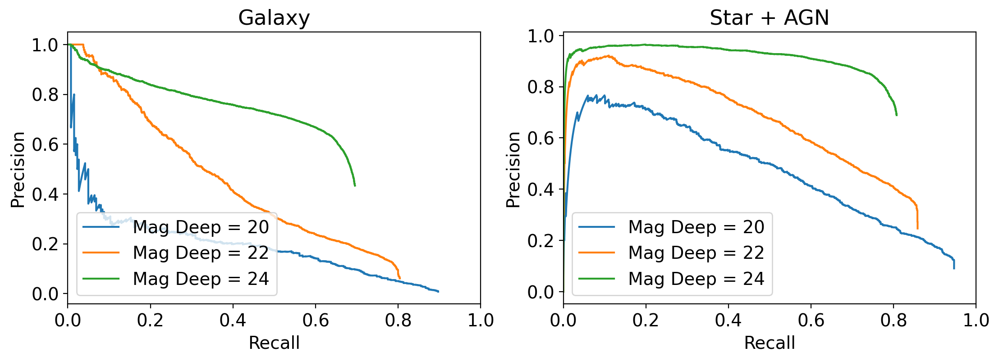

In [27]:
fig, axs = plt.subplots(1,2, figsize=(13,4))


for i,ax in enumerate(axs.ravel()):
    
    for j in range(len(maglmt_lst)):
        if i==0:
            ax.plot(
                gal_recall_mag_lst[j], gal_precision_mag_lst[j],
                label='Mag Deep = %d'%maglmt_lst[j]
            )
            ax.set_title('Galaxy');fig, axs = plt.subplots(1,2, figsize=(13,4))


for i,ax in enumerate(axs.ravel()):
    
    for j in range(len(maglmt_lst)):
        if i==0:
            ax.plot(
                gal_recall_mag_lst[j], gal_precision_mag_lst[j],
                label='Mag Deep = %d'%maglmt_lst[j]
            )
            ax.set_title('Galaxy');
            
        else:
            ax.plot(
                star_recall_mag_lst[j], star_precision_mag_lst[j],
                label='Mag Deep = %d'%maglmt_lst[j]
            )
            ax.set_title('Star + AGN');
    
    ax.legend();
    ax.set_xlim(0, 1); ax1.set_ylim(0, 1)
    ax.set_xlabel('Recall'); 
    ax.set_ylabel('Precision');
            
        else:
            ax.plot(
                star_recall_mag_lst[j], star_precision_mag_lst[j],
                label='Mag Deep = %d'%maglmt_lst[j]
            )
            ax.set_title('Star + AGN');
    
    ax.legend();
    ax.set_xlim(0, 1); ax1.set_ylim(0, 1)
    ax.set_xlabel('Recall'); 
    ax.set_ylabel('Precision');

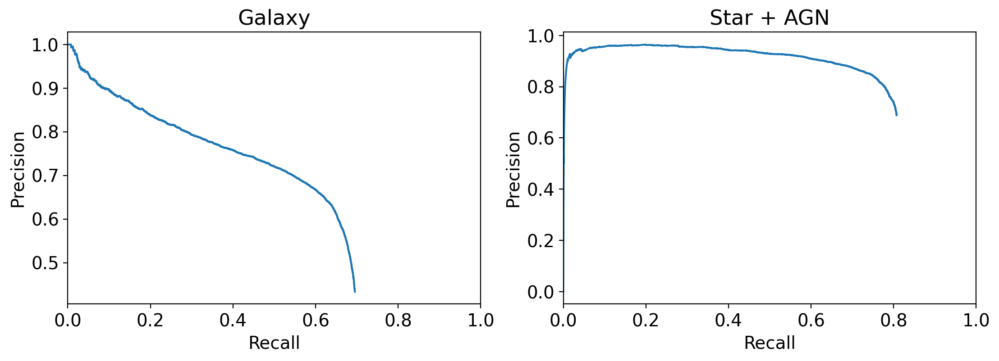

In [60]:
fig, axs = plt.subplots(1,2, figsize=(13,4))


for i,ax in enumerate(axs.ravel()):
    
    if i==0:
        ax.plot(
            gal_recall_mag_lst[2], gal_precision_mag_lst[2],
        )
        ax.set_title('Galaxy');

    else:
        ax.plot(
            star_recall_mag_lst[2], star_precision_mag_lst[2],
        )
        ax.set_title('Star + AGN');
    
    ax.set_xlim(0, 1); ax1.set_ylim(0, 1)
    ax.set_xlabel('Recall'); 
    ax.set_ylabel('Precision');

In [77]:
# maglmt_lst   = [20, 21, 22, 23, 24]
# map_mag_lst  = []
# gal_recall_mag_lst = []
# gal_precision_mag_lst = []
# star_recall_mag_lst = []
# star_precision_mag_lst = []

# for i, maglmt in tqdm(enumerate(maglmt_lst)):
    
#     gts_mag = [gts[_][targets[_]['mag']<maglmt] for _ in range(len(gts))]
    
#     metric_fn = detect_metric(preds, gts_mag)
#     map_mag_lst.append(
#         metric_fn.value(
#             iou_thresholds=iou, 
#             recall_thresholds=np.arange(0, 1.1, 0.1))['mAP']
#     )
#     gal_recall_mag_lst.append(metric_fn.value()[iou][0]['recall'])
#     gal_precision_mag_lst.append(metric_fn.value()[iou][0]['precision'])
    
#     star_recall_mag_lst.append(metric_fn.value()[iou][1]['recall'])
#     star_precision_mag_lst.append(metric_fn.value()[iou][1]['precision'])

# fig, axs = plt.subplots(1,2, figsize=(13,4))


# for i,ax in enumerate(axs.ravel()):
    
#     for j in range(len(maglmt_lst)):
#         if i==0:
#             ax.plot(
#                 gal_recall_mag_lst[j], gal_precision_mag_lst[j],
#                 label='Mag Deep = %d'%maglmt_lst[j]
#             )
#             ax.set_title('Galaxy');
            
#         else:
#             ax.plot(
#                 star_recall_mag_lst[j], star_precision_mag_lst[j],
#                 label='Mag Deep = %d'%maglmt_lst[j]
#             )
#             ax.set_title('Star + AGN');
    
#     ax.legend();
#     ax.set_xlim(0, 1); ax1.set_ylim(0, 1)
#     ax.set_xlabel('Recall'); 
#     ax.set_ylabel('Precision');